<a href="https://colab.research.google.com/github/bnsreenu/python_for_microscopists/blob/master/328a_smFISH_analysis_using_Big_FISH_singleplex.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://youtu.be/c_uh0YelIHA

**smFISH analysis using the Big-FISH library**

This tutorial is a walkthrough of smFISH (single-molecule fluorescence in situ hybridization) analysis using the Big-FISH library. The code demonstrates various steps involved in the analysis, including image reading, normalization and filtering, spot detection, segmentation of nuclei and cells, extraction of cell-level results, and computation of features for each cell - in a singleplex dataset. <p>

By analyzing the extracted features and the spatial distribution of spots within cells, researchers can gain insights into various aspects of cellular processes, including gene expression, RNA localization, and spatial organization. These insights can contribute to understanding the functional organization of cells and uncovering potential relationships between gene expression patterns and cellular phenotypes.<p>

The "spots" in smFISH analysis refer to individual mRNA molecules that have been labeled with fluorescent probes and can be visualized as discrete signals in the images. Each spot represents the presence of a specific mRNA molecule within the cell. <p>

The brightness of a spot generally corresponds to the abundance or level of the mRNA molecule it represents. Bright spots indicate a higher concentration of the mRNA molecule, suggesting higher expression levels of the corresponding gene. Conversely, dimmer spots may indicate lower expression levels. <p>

"Clusters" refer to groups of spots that are in close proximity to each other. Clusters can arise due to various reasons, such as multiple mRNA molecules originating from the same gene or co-localization of mRNA molecules from different genes. The presence of clusters may indicate co-regulation or co-localization of specific mRNA molecules within the cell. <p>

Spots that are classified as "inside" the nucleus are localized within the nuclear boundary, indicating that the corresponding mRNA molecules are likely involved in nuclear processes, such as transcription, splicing, or RNA processing. On the other hand, spots classified as "outside" the nucleus are located in the cytoplasm, suggesting that the corresponding mRNA molecules have been transported out of the nucleus and are involved in cytoplasmic processes, such as translation. <p>

Analyzing the distribution of spots inside and outside the nucleus can provide insights into gene expression regulation and mRNA localization. For example, certain genes may exhibit preferential nuclear localization, indicating their involvement in nuclear processes. On the other hand, cytoplasmic localization may be associated with mRNA molecules that are actively being translated or are involved in cytoplasmic functions.

**Dataset / images for this exercise:** <br>
Researchers often work with fluorescence in situ hybridization (FISH) images that involve multiple channels containing spots from multiple RNA molecules. FISH techniques can be designed to target specific RNA molecules of interest using fluorescently labeled probes. Each RNA molecule can be labeled with a different fluorophore, allowing researchers to distinguish and visualize multiple RNA species simultaneously. <p>

There are multiple data sets to play with but for this exercise we will be using the example images provided via the big-fish library.
<p> Running this line: stack.check_input_data(path_input, input_segmentation=True) will place four images in your directory of choice. <br>
experiment_1_dapi_fov_1.tif
experiment_1_smfish_fov_1.tif
example_nuc_full.tif
example_cell_full.tif

1. experiment_1_dapi_fov_1.tif
2. experiment_1_smfish_fov_1.tif
3. example_nuc_full.tif
3. example_cell_full.tif
<br>
We will be primarily working with the first two images where dapi is used to segment nuclei and smfish image gets used to segment cells and spot detection. As mntioned above, in real situations you may be working with multichannel images representing signals from multiple RNA molecules.

<p>

**Other datasets of use:**
<br>
This is a good reference paper that mentions a few datasets: https://static-content.springer.com/esm/art%3A10.1038%2Fs41592-022-01669-y/MediaObjects/41592_2022_1669_MOESM1_ESM.pdf
<br>


**python environment requirements:** <br>
Big-FISH requires Python 3.6 or newer. Additionally, it has the following dependencies which should be fine if you are working on colab:
<br>
numpy (>= 1.16.0) <br>
scipy (>= 1.4.1) <br>
scikit-learn (>= 0.24.0) <br>
scikit-image (>= 0.14.2) <br>
matplotlib (>= 3.0.2) <br>
pandas (>= 0.24.0) <br>
mrc (>= 0.1.5) <p>
For segmentation purpose, two additional dependencies may be required:
<br>
tensorflow (== 2.3.0)<br>
tensorflow-addons (== 0.12.1)
<p>
Finally, pip install big-fish

In [ ]:
!pip install mrc big-fish

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.2/123.2 kB 19.7 MB/s eta 0:00:00


# Read images
<br>
Let us start by reading images using bigfish.

In [ ]:
import os
import numpy as np
import bigfish
import bigfish.stack as stack
import bigfish.detection as detection
import bigfish.multistack as multistack
import bigfish.plot as plot
print("Big-FISH version: {0}".format(bigfish.__version__))

Big-FISH version: 0.6.2


In [ ]:
from matplotlib import pyplot as plt

Provide directory paths to input images and to store outputs.

In [ ]:
path_input = "/content/drive/MyDrive/ColabNotebooks/data/smFish/example_data/input"
path_output = "/content/drive/MyDrive/ColabNotebooks/data/smFish/example_data/output"

Let us download a few test images to our input directory. By setting input_segmentation=True we will be downloading a couple of images for segmentation exercise but we will not be using them anyway. They are good images to play with, so save for future use.

In [ ]:
# To download all test images into our input directory...
stack.check_input_data(path_input, input_segmentation=True)

Our dapi and rna images are tif stacks with 23 images, each 650x500 in dimensions.

In [ ]:
rna = stack.read_image(os.path.join(path_input, "experiment_1_smfish_fov_1.tif"))
print("rna stack")
print("\r shape: {0}".format(rna.shape))
print("\r dtype: {0}".format(rna.dtype), "\n")


dapi = stack.read_image(os.path.join(path_input, "experiment_1_dapi_fov_1.tif"))
print("dapi stack")
print("\r shape: {0}".format(dapi.shape))
print("\r dtype: {0}".format(dapi.dtype), "\n")



rna stack
 shape: (23, 650, 500)
 dtype: uint16 

dapi stack
 shape: (23, 650, 500)
 dtype: uint16 



We can use plot function from bigfish.plot for easy visualization of multiple images. <br> Please note that we will be primarily working with the middle slice (number 11) for the most of the tutorial.

In [ ]:
slice_num = 11

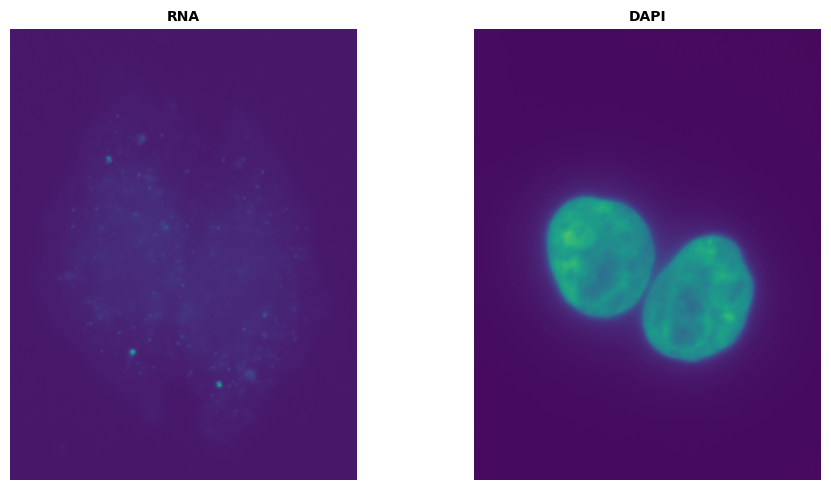

In [ ]:
plot.plot_images([rna[slice_num,:,:], dapi[slice_num,:,:]], titles=["RNA", "DAPI"], framesize=(10, 5))

# Normalize and filter

Let us understand the normalize and filter operations available in bigfish. Let us take a single slice (center) from rna and dapi for this exercise.

In [ ]:
dapi_2d = dapi[slice_num]
print("dapi channel (one z-slice)")
print("\r shape: {0}".format(dapi_2d.shape))
print("\r dtype: {0}".format(dapi_2d.dtype), "\n")

rna_2d = rna[slice_num]
print("smfish channel (one z-slice)")
print("\r shape: {0}".format(rna_2d.shape))
print("\r dtype: {0}".format(rna_2d.dtype))

dapi channel (one z-slice)
 shape: (650, 500)
 dtype: uint16 

smfish channel (one z-slice)
 shape: (650, 500)
 dtype: uint16


**Rescale pixel intensity** <br>
Rescaling an image means we rescale its pixel intensity range to its dtype limits (or between 0 and 1 for float image). We can enhance the contrast of the image by stretching it. The operation is a simple rescaling, but based on a smaller range of pixel intensity than the one actually observed in the image.

In [ ]:
rna_2d_rescaled = stack.rescale(rna_2d, channel_to_stretch=None)
rna_2d_stretched = stack.rescale(rna_2d, channel_to_stretch=0)

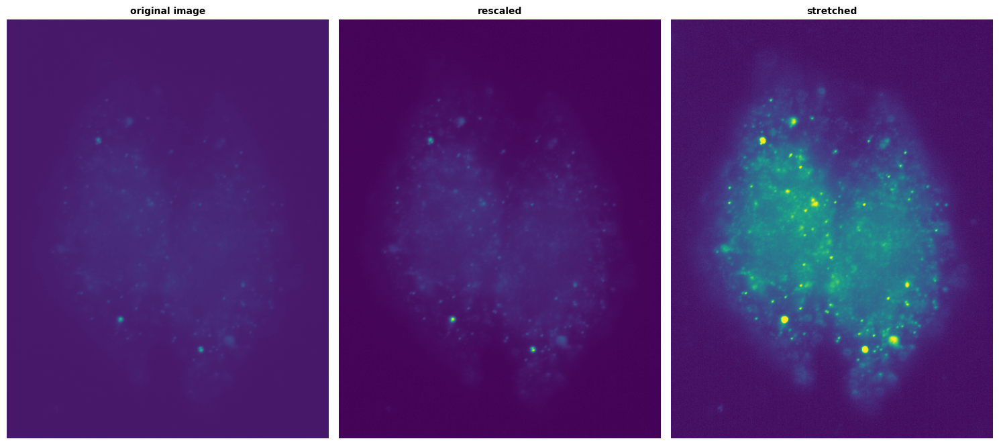

In [ ]:
images = [rna_2d, rna_2d_rescaled, rna_2d_stretched]
titles = ["original image", "rescaled", "stretched"]
plot.plot_images(images, titles=titles)

**Project in 2 dimensions**
<br>
It is common to prohject slices into 2D to manage out of focus z-slices. There are many approaches for this projection including maximum, mean, and median projections. Maximum intensity projection is a common approach.

In [ ]:
dapi_mip = stack.maximum_projection(dapi)
rna_mip = stack.maximum_projection(rna)


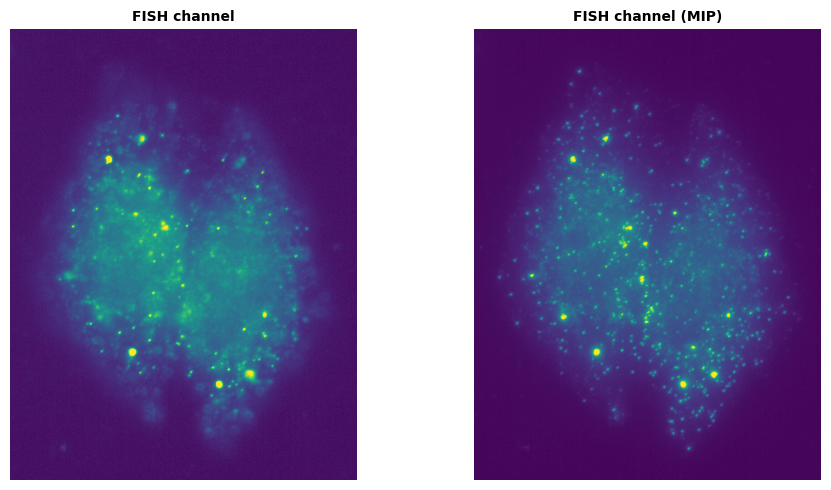

In [ ]:
images = [rna[slice_num,:,:], rna_mip]  #Plotting 11th slice from the rna image stack
titles = ["FISH channel", "FISH channel (MIP)"]
plot.plot_images(images, titles=titles, framesize=(10, 5), contrast=True)

**Focus projection** <br>
One way to deal with out-of-focus z-slices is bigfish.stack.focus_projection. We only project the zyx voxels with the highest sharpness score.

In [ ]:
rna_focus = stack.focus_projection(rna, proportion=0.75, neighborhood_size=7, method="median")

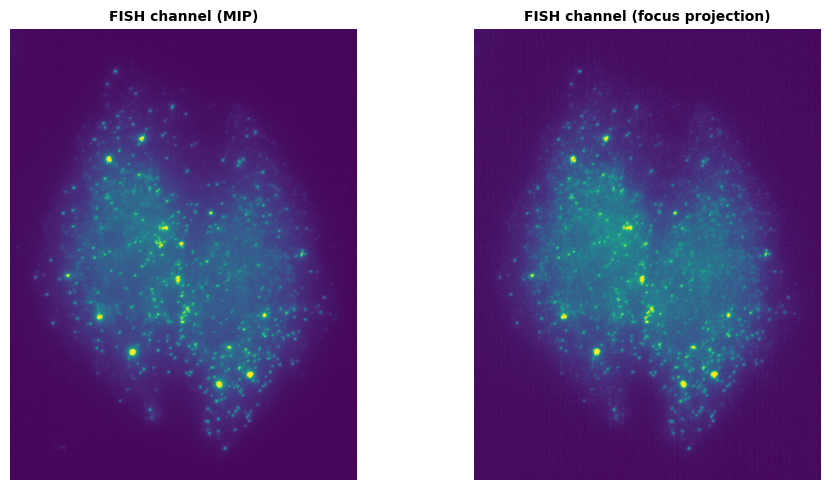

In [ ]:
# RNA
images = [rna_mip, rna_focus]
titles = ["FISH channel (MIP)", "FISH channel (focus projection)"]
plot.plot_images(images, titles=titles, framesize=(10, 5), contrast=True)

# Spot detection <br>
Spot detection is a key step in FISH-based mRNA detection. We will perform spot detection based on local maximum in the smFISH channel and we will detect clustered spots. We use rna image for spot detection. Please note that the dapi image will not show spots, only gets used for nuclei segmentation. <br>


In [ ]:
spots, threshold = detection.detect_spots(
    images=rna,
    return_threshold=True,
    voxel_size=(300, 103, 103),  # in nanometer (one value per dimension zyx)
    spot_radius=(350, 150, 150))  # in nanometer (one value per dimension zyx)
print("detected spots")
print("\r shape: {0}".format(spots.shape))
print("\r dtype: {0}".format(spots.dtype))
print("\r threshold: {0}".format(threshold))

detected spots
 shape: (771, 3)
 dtype: int64
 threshold: 355.0


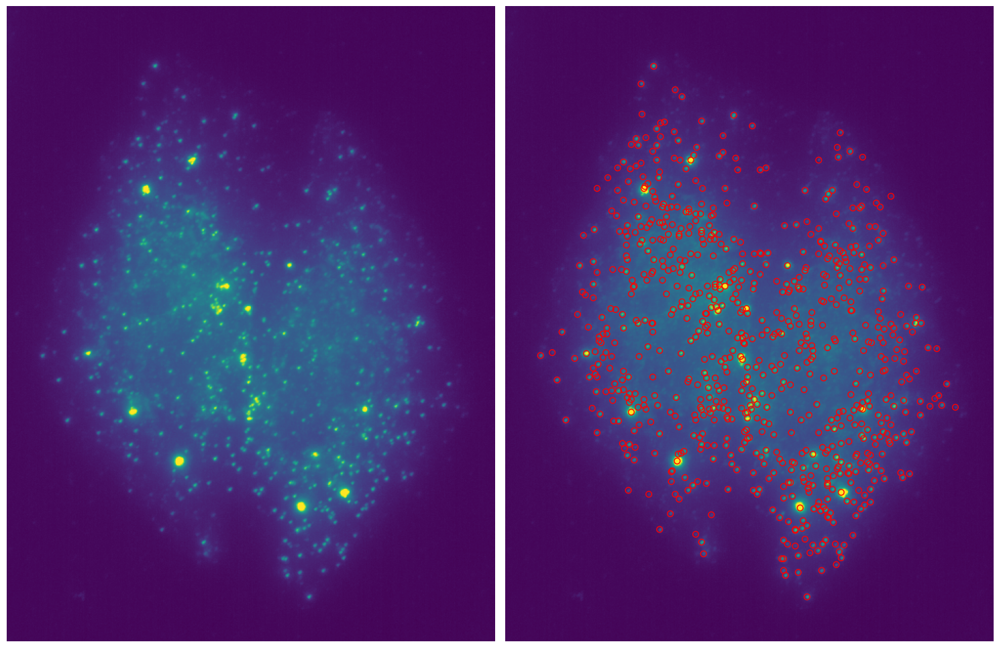

In [ ]:
plot.plot_detection(rna_mip, spots, contrast=True)

The automated spot detection method tries to find the optimal threshold to discriminate actual spots from noisy blobs. If we plot the number of the spots detected as a function of threshold level we observe an elbow curve. The selected threhold is the one located in the breaking point of the curve.

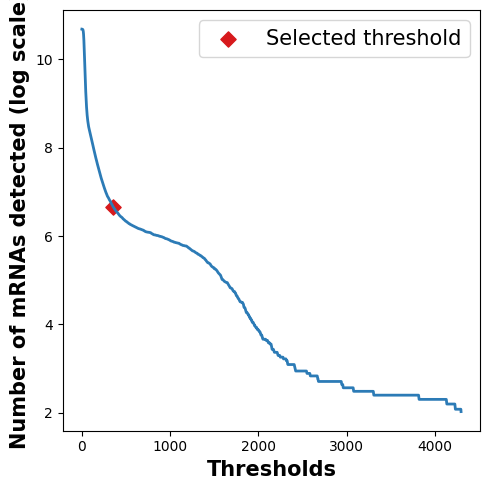

In [ ]:
plot.plot_elbow(
    images=rna,
    voxel_size=(300, 103, 103),
    spot_radius=(350, 150, 150))

**Dense region decomposition**
<br>
The detection of local maximum is **not able to detect individual spots clustered in a dense and bright region**. We try to decompose these regions by simulating as many spots as possible until we match the original region intensity. The bigfish.detection.decompose_dense method performs the dense region decomposition and returns the 2D or 3D coordinates of the detected spots outside and inside a decomposed region, additional information about the regions themself and an image of the reference spot estimated.

In [ ]:
spots_post_decomposition, dense_regions, reference_spot = detection.decompose_dense(
    image=rna,
    spots=spots,
    voxel_size=(300, 103, 103),
    spot_radius=(350, 150, 150),
    alpha=0.7,  # alpha impacts the number of spots per candidate region
    beta=1,  # beta impacts the number of candidate regions to decompose
    gamma=5)  # gamma the filtering step to denoise the image
print("detected spots before decomposition")
print("\r shape: {0}".format(spots.shape))
print("\r dtype: {0}".format(spots.dtype), "\n")
print("detected spots after decomposition")
print("\r shape: {0}".format(spots_post_decomposition.shape))
print("\r dtype: {0}".format(spots_post_decomposition.dtype))

detected spots before decomposition
 shape: (771, 3)
 dtype: int64 

detected spots after decomposition
 shape: (1163, 3)
 dtype: int64


Plot and keep an eye on the bright spots. Compare the spots in these regions with the previous image. We should see more spots now.

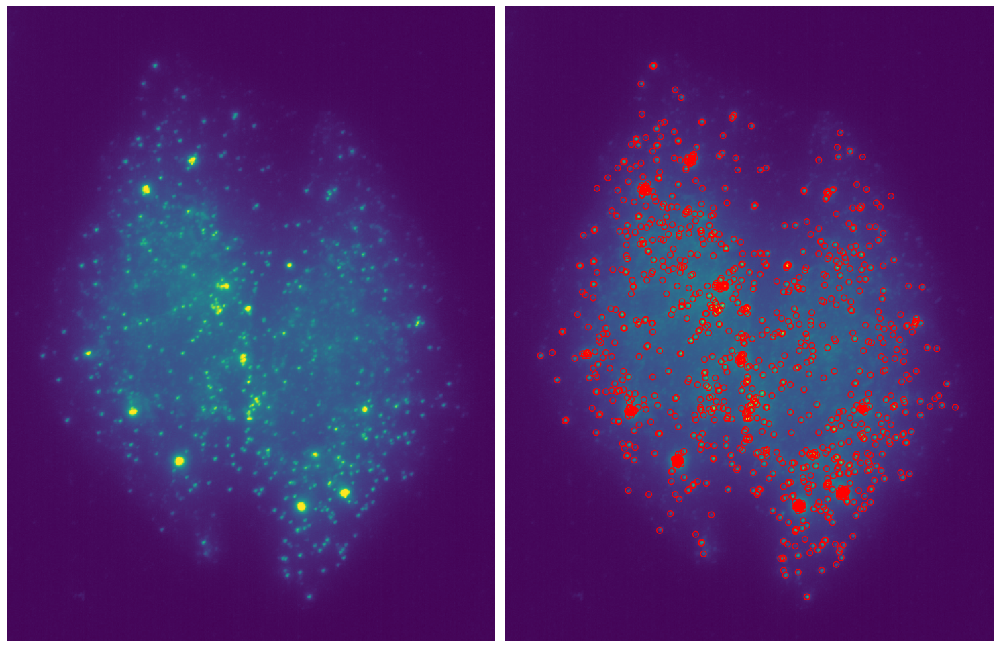

In [ ]:
plot.plot_detection(rna_mip, spots_post_decomposition, contrast=True)

**Clusters detection**
<br>
Two spots are considered connected if they localized within a specific radius (in nanometer). Above a minimum number of connected spots, a cluster can be defined.

In [ ]:
spots_post_clustering, clusters = detection.detect_clusters(
    spots=spots_post_decomposition,
    voxel_size=(300, 103, 103),
    radius=350,
    nb_min_spots=4)
print("detected spots after clustering")
print("\r shape: {0}".format(spots_post_clustering.shape))
print("\r dtype: {0}".format(spots_post_clustering.dtype), "\n")
print("detected clusters")
print("\r shape: {0}".format(clusters.shape))
print("\r dtype: {0}".format(clusters.dtype))

detected spots after clustering
 shape: (1163, 4)
 dtype: int64 

detected clusters
 shape: (21, 5)
 dtype: int64


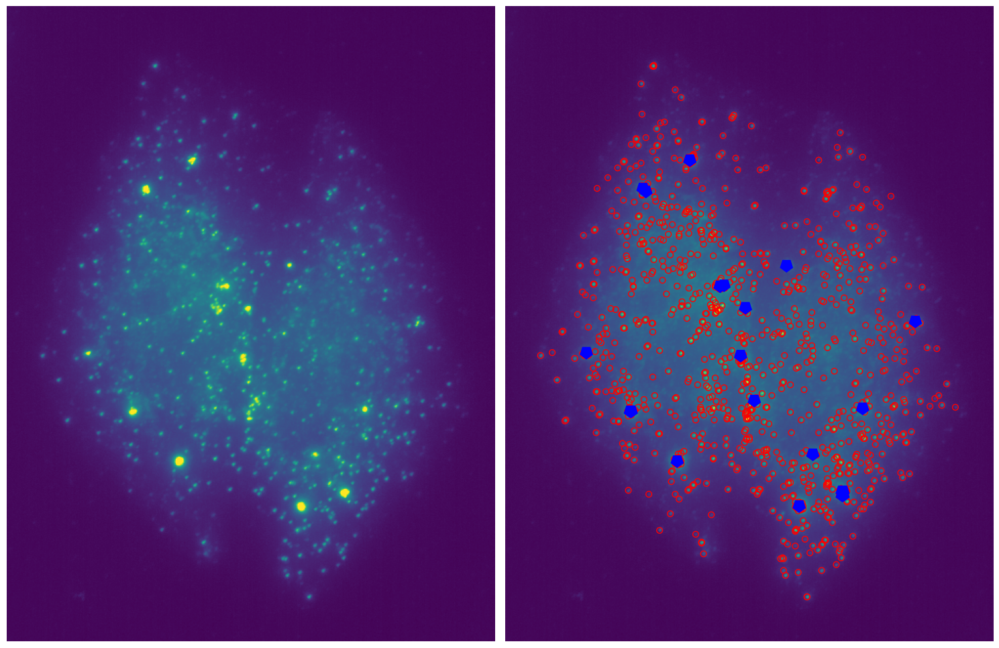

In [ ]:
# plot
plot.plot_detection(rna_mip,
                    spots=[spots_post_decomposition, clusters[:, :3]],
                    shape=["circle", "polygon"],
                    radius=[3, 6],
                    color=["red", "blue"],
                    linewidth=[1, 2],
                    fill=[False, True],
                    contrast=True)

**Sub-pixel fitting** <br>
If you analyze few isolated spots, it is possible to refine spots detections at the subpixel level

In [ ]:
# pixel fitting
spots_rna = detection.detect_spots(
    images=rna,
    threshold=355.0,  # previous threshold automatically find in the full image
    voxel_size=(300, 103, 103),
    spot_radius=(350, 150, 150))
print("spots (pixel fitting)")
print("\r shape: {0}".format(spots_rna.shape))
print("\r dtype: {0}".format(spots_rna.dtype), "\n")

# subpixel fitting
spots_subpixel_rna = detection.fit_subpixel(
    image=rna,
    spots=spots_rna,
    voxel_size=(300, 103, 103),
    spot_radius=(350, 150, 150))
print("spots (subpixel fitting)")
print("\r shape: {0}".format(spots_subpixel_rna.shape))
print("\r dtype: {0}".format(spots_subpixel_rna.dtype))

spots (pixel fitting)
 shape: (771, 3)
 dtype: int64 

spots (subpixel fitting)
 shape: (771, 3)
 dtype: float64


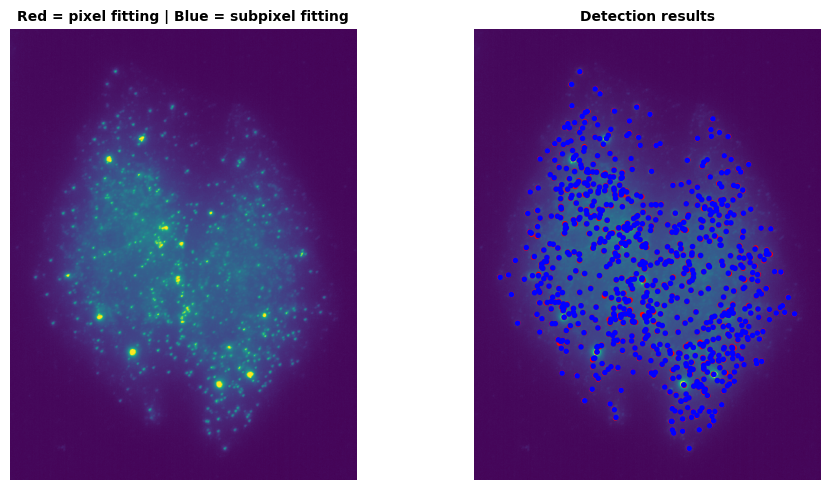

In [ ]:
# plot
plot.plot_detection(
    rna_mip,
    spots=[spots_rna, spots_subpixel_rna],
    radius=2,
    color=["red", "blue"],
    title="Red = pixel fitting | Blue = subpixel fitting",
    linewidth=2, contrast=True, framesize=(10, 5))

# Colocalization - provided for completeness sake - Not needed for our exercise

**Colocalization**<br>
To detect colocalized spots (over different channels), the function bigfish.multistack.detect_spots_colocalization is available. Here, as an example, we detect colocalized spots between the ones detected with a pixel accuracy and the ones with subpixel accuracy. Like the regular spot detection, if a threshold is not provided to discriminate colocalized spots from distant ones, the function tries to set one, automatically.

In [ ]:
"""
(spots_1_colocalized, spots_2_colocalized,
 distances,
 indices_1, indices_2,
 threshold) = multistack.detect_spots_colocalization(
    spots_1=spots_rna,
    spots_2=spots_subpixel_rna,
    voxel_size=(300, 103, 103),
    return_indices=True,
    return_threshold=True)
print("colocalized spots")
print("\r shape 1: {0}".format(spots_1_colocalized.shape))
print("\r shape 2: {0}".format(spots_2_colocalized.shape))
print("\r distances: {0}".format(distances.shape))
print("\r indices 1: {0}".format(indices_1.shape))
print("\r indices 2: {0}".format(indices_2.shape))
print("\r threshold: {0:0.2f} nm".format(threshold))
"""

In [ ]:
"""
# plot
plot.plot_detection(
    rna_mip,
    spots=[spots_1_colocalized, spots_2_colocalized],
    radius=2,
    color=["red", "blue"],
    title="Red = pixel fitting | Blue = subpixel fitting",
    linewidth=2, contrast=True, framesize=(10, 5))
    """

In [ ]:
"""
plot.plot_elbow_colocalized(
    spots_1=spots_rna,
    spots_2=spots_subpixel_rna,
    voxel_size=(300, 103, 103))
    """

**Export results for further analysis**




In [ ]:
# save in npy files
path = os.path.join(path_output, "spots.npy")
stack.save_array(spots_post_clustering, path)
path = os.path.join(path_output, "clusters.npy")
stack.save_array(clusters, path)

# save in csv files
path = os.path.join(path_output, "spots.csv")
stack.save_data_to_csv(spots_post_clustering, path)
path = os.path.join(path_output, "clusters.csv")
stack.save_data_to_csv(clusters, path)

# Segment nuclei and cells <br>
In order to attribute detected spots to nuclei and cytoplasmic regions in each cell, these need to be segmented. There aremany approaches to segment nuclei and cells including conventional threshokding followed by watershed, deep learning based U-net, StarDist and Cellpose. For this exercise, we will use Cellpose to segment cells and pre-trained U-net to segment nuclei. <p>
Let us first have aother look at the dapi and rna (smFISH) images. Please note that you can use a signle slice or a mip image from these stacks, we will work with the middle slice.

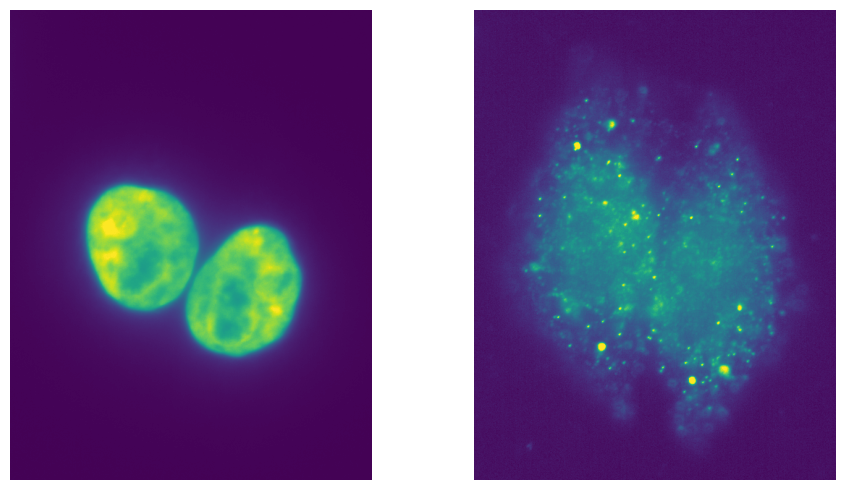

In [ ]:
plot.plot_images([dapi[slice_num,:,:], rna[slice_num,:,:]], contrast=True, framesize=(10, 5))

### **Cell segmentation**
<br>
Cellpose does a good job in segmenting cells of various types.

In [ ]:
!pip install cellpose

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.7/171.7 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 93.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 44.4 MB/s eta 0:00:00


In [ ]:
from cellpose import core, models

In [ ]:
model = models.Cellpose(gpu=True, model_type='cyto')

100%|██████████| 25.3M/25.3M [00:03<00:00, 8.17MB/s]
100%|██████████| 5.23k/5.23k [00:00<00:00, 10.8MB/s]


In [ ]:
channels = [0,0]  #Grayscale image. Looks at the documentation of cellpose for multichannel images

In [ ]:
cell_label, _, _, _ = model.eval(rna[slice_num,:,:], diameter=170, batch_size=4, flow_threshold=None, channels=channels)

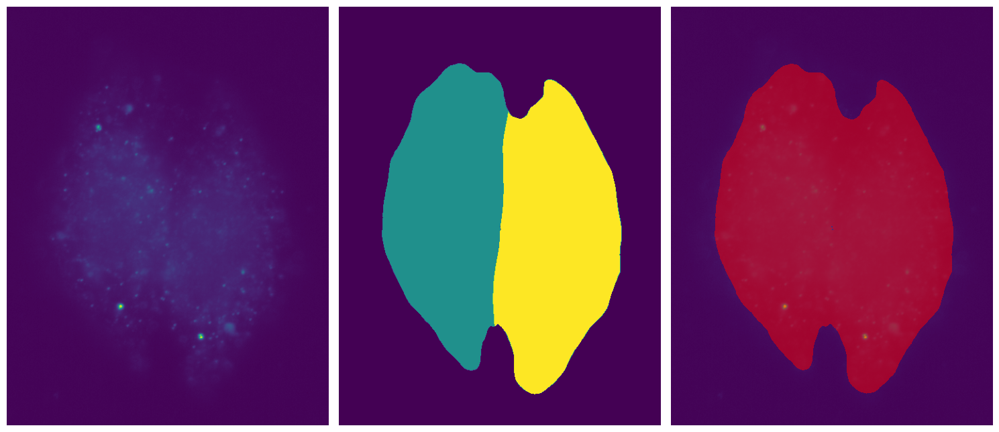

In [ ]:
plot.plot_segmentation(rna[slice_num,:,:], cell_label, rescale=True)

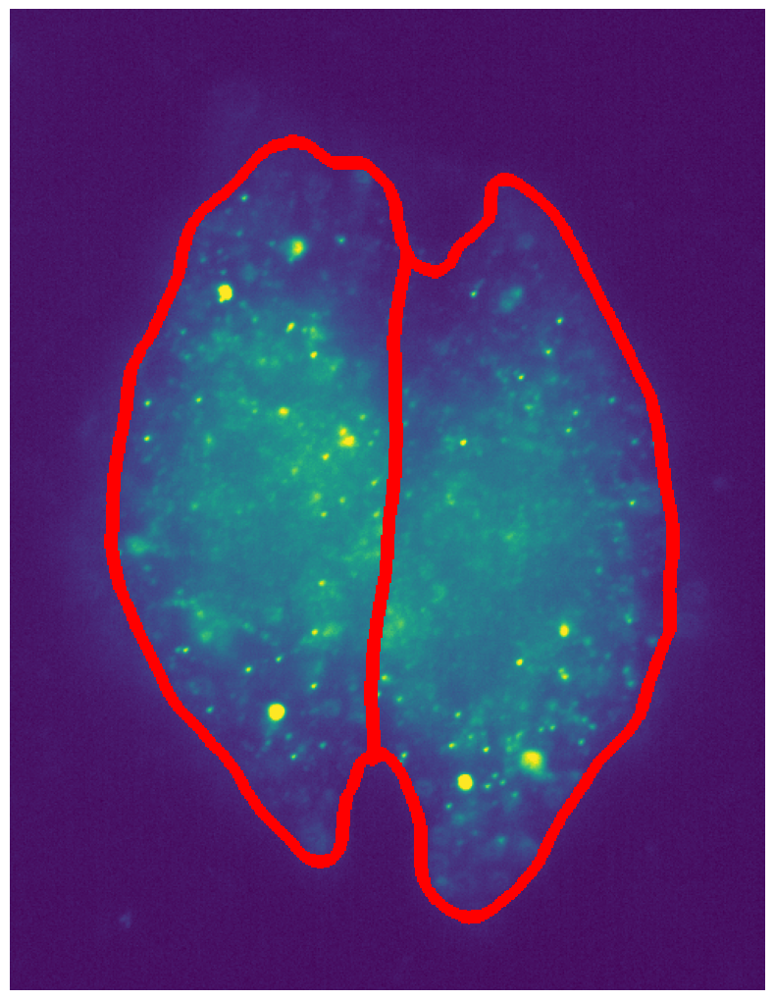

In [ ]:
plot.plot_segmentation_boundary(rna[11,:,:], cell_label, contrast=True, boundary_size=4)

### **Nuclei segmentation:** <br>

In this part of the exercise, we will be using pre-trained u-net. Please note that Stardist works great on nuclei segmentation but may fail for very large objects which is the case for us. <br>

Install tensorflow and tensorflow-addons. On colab, tensorflow is available by default

<br>
**Warning:** This method (using U-net from bigfish) seems to not release GPU resources after the job is done. If possible, try thresholding + watershed or stardist or other means to separate nuclei.

In [ ]:
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 23.8 MB/s eta 0:00:00


In [ ]:
import bigfish.segmentation as segmentation

/usr/local/lib/python3.10/dist-packages/bigfish/segmentation/nuc_segmentation.py:16: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology.selem import disk


In [ ]:
# load pretrained model
model_nuc = segmentation.unet_3_classes_nuc()
model_nuc.summary()

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


downloading model weights...
Model: "3ClassesModel"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
image (InputLayer)           [(None, None, None, 1)]   0         
_________________________________________________________________
encoder_decoder (EncoderDeco (None, None, None, 32)    8086400   
_________________________________________________________________
final_conv (SameConv)        (None, None, None, 3)     105       
_________________________________________________________________
label_3 (Softmax)            (None, None, None, 3)     0         
Total params: 8,086,505
Trainable params: 8,086,505
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# instance segmentation
nuc_label = segmentation.apply_unet_3_classes(
    model_nuc, dapi[11,:,:], target_size=256, test_time_augmentation=True)
print("nucleus labels")
print("\r shape: {0}".format(nuc_label.shape))
print("\r dtype: {0}".format(nuc_label.dtype))

nucleus labels
 shape: (650, 500)
 dtype: int64


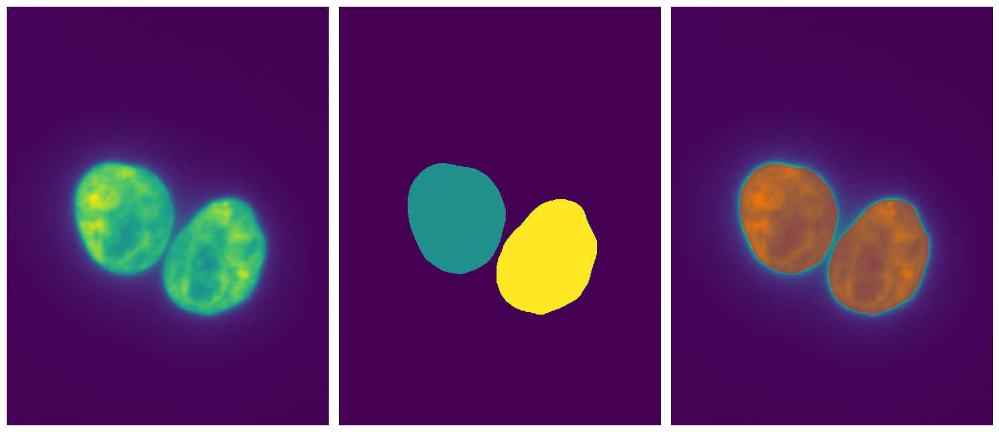

In [ ]:
plot.plot_segmentation(dapi[11,:,:], nuc_label, rescale=True)


**Postprocessing:** <br>
Additional cleaning functions can be applied to the labels with bigfish.segmentation.clean_segmentation to smooth the segmented boundaries or properly delimit the different instances. <br> But first we need to convert cell_label to int64 as that is the supported type by clean_segmentation operation

In [ ]:
cell_label_int64 = cell_label.astype(np.int64)
cell_label_int64.dtype

dtype('int64')

In [ ]:
nuc_label = segmentation.clean_segmentation(nuc_label, delimit_instance=True)
cell_label = segmentation.clean_segmentation(cell_label_int64, smoothness=7, delimit_instance=True)
nuc_label, cell_label = multistack.match_nuc_cell(nuc_label, cell_label, single_nuc=False, cell_alone=True)

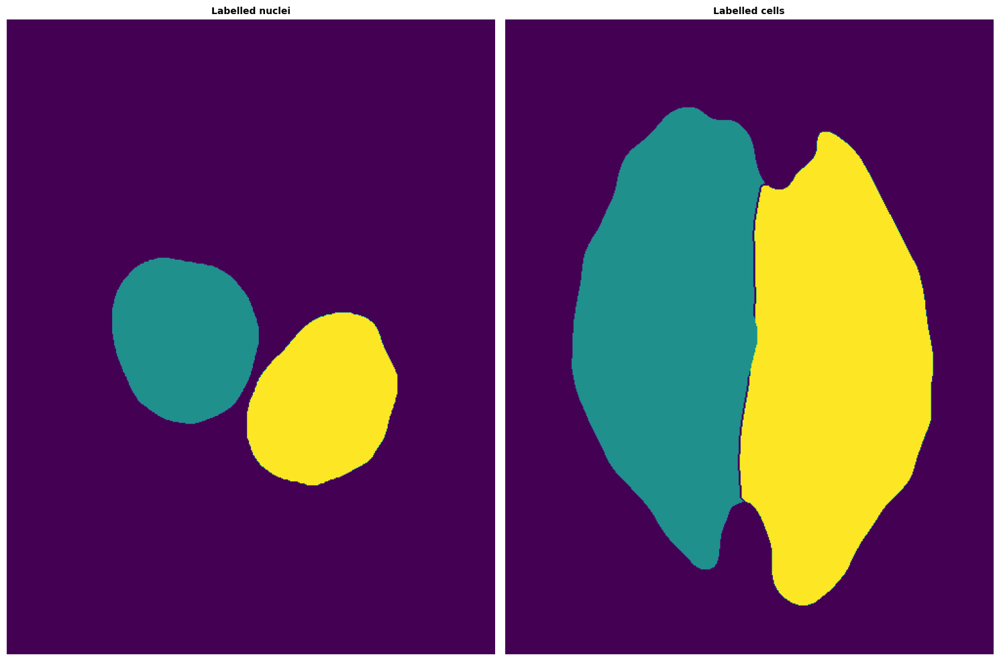

In [ ]:
plot.plot_images([nuc_label, cell_label], titles=["Labelled nuclei", "Labelled cells"])

**Save results** for further processing

In [ ]:

# save nucleus and cell labels
path = os.path.join(path_output, "nuc_label.tif")
stack.save_image(nuc_label, path)
path = os.path.join(path_output, "cell_label.tif")
stack.save_image(cell_label, path)

# Extract cell level results <br>
Here we will extract the spot results at the cell level. We already have mip images of dapi and rna.

In [ ]:
print("dapi channel")
print("\r shape: {0}".format(dapi.shape))
print("\r dtype: {0}".format(dapi.dtype), "\n")
print("smfish channel")
print("\r shape: {0}".format(rna.shape))
print("\r dtype: {0}".format(rna.dtype))

dapi channel
 shape: (23, 650, 500)
 dtype: uint16 

smfish channel
 shape: (23, 650, 500)
 dtype: uint16


Let us generate a contrasted image so it makes it easy for us to visualize when we overlay segmented nuclei and cell data. This step is optional. This image is supplied as input to the cell extraction step (multistack_extract_cell).

In [ ]:

image_contrasted = stack.rescale(rna, channel_to_stretch=0)
image_contrasted = stack.maximum_projection(image_contrasted)


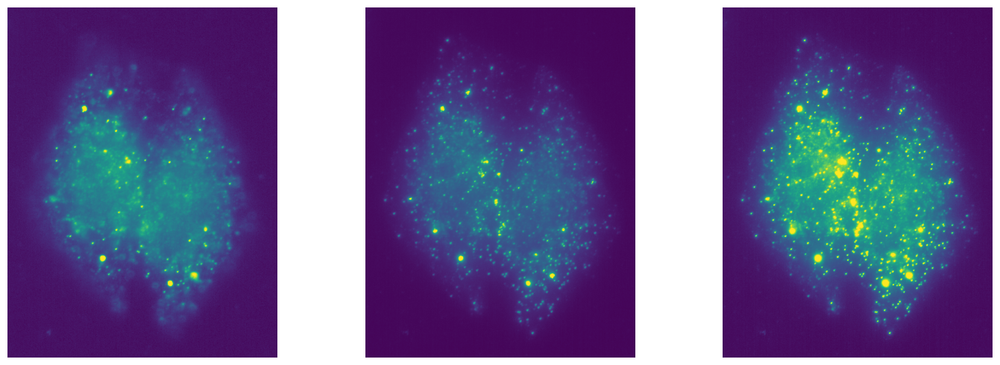

In [ ]:

plot.plot_images([rna[11,:,:], rna_mip, image_contrasted], contrast=True, framesize=(15, 5))


Read segmentation and detection results

In [ ]:
# segmented cells
path = os.path.join(path_output, "cell_label.tif")
cell_label = stack.read_image(path)
print("segmented cells")
print("\r shape: {0}".format(cell_label.shape))
print("\r dtype: {0}".format(cell_label.dtype), "\n")

# segmented nuclei
path = os.path.join(path_output, "nuc_label.tif")
nuc_label = stack.read_image(path)
print("segmented nuclei")
print("\r shape: {0}".format(nuc_label.shape))
print("\r dtype: {0}".format(nuc_label.dtype), "\n")

# detected spots
path = os.path.join(path_output, "spots.csv")
spots = stack.read_array_from_csv(path, dtype=np.int64)
print("detected spots")
print("\r shape: {0}".format(spots.shape))
print("\r dtype: {0}".format(spots.dtype), "\n")

# detected foci
path = os.path.join(path_output, "clusters.csv")
clusters = stack.read_array_from_csv(path, dtype=np.int64)
print("detected clusters")
print("\r shape: {0}".format(clusters.shape))
print("\r dtype: {0}".format(clusters.dtype))

segmented cells
 shape: (650, 500)
 dtype: int64 

segmented nuclei
 shape: (650, 500)
 dtype: int64 

detected spots
 shape: (1163, 4)
 dtype: int64 

detected clusters
 shape: (21, 5)
 dtype: int64


**Transcription sites** <br>
A transcription site refers to the location in the nucleus where RNA is being actively transcribed from DNA. In FISH analysis, a transcription site is a cluster detected inside the nucleus. <p>
Please note that...<br>

**Foci:** In cellular imaging techniques like fluorescence in situ hybridization (FISH), foci refer to specific spots or signals observed within the nucleus of a cell. Foci are typically associated with the localization or accumulation of specific nucleic acid sequences or proteins within the nucleus. These spots can represent various biological processes, such as gene expression, DNA replication, or the formation of protein complexes. Foci can be visualized using fluorescently labeled probes that specifically bind to the target sequences of interest.
<p>

**Transcription Sites:** Transcription sites, on the other hand, specifically refer to the regions within the nucleus where transcription (the process of synthesizing RNA from a DNA template) occurs. Transcription sites are specialized subnuclear compartments where RNA polymerase enzymes and other transcription factors assemble to initiate and carry out transcription. These sites are often referred to as transcription factories, where active genes are transcribed into RNA molecules.
<p>

While foci and transcription sites can both be observed within the nucleus, they represent different aspects of cellular processes. Foci are more general in nature and can represent a variety of events or structures, whereas transcription sites specifically refer to the specialized compartments involved in the transcription of genes.
<p>

**We can discriminate foci from transcription sites with the function bigfish.multistack.remove_transcription_site**

In [ ]:
spots_no_ts, foci, ts = multistack.remove_transcription_site(spots, clusters, nuc_label, ndim=3)
print("detected spots (without transcription sites)")
print("\r shape: {0}".format(spots_no_ts.shape))
print("\r dtype: {0}".format(spots_no_ts.dtype))

detected spots (without transcription sites)
 shape: (1129, 4)
 dtype: int64


we can identify objects in specific cellular compartments with the following function

In [ ]:
spots_in, spots_out = multistack.identify_objects_in_region(nuc_label, spots, ndim=3)
print("detected spots (inside nuclei)")
print("\r shape: {0}".format(spots_in.shape))
print("\r dtype: {0}".format(spots_in.dtype), "\n")
print("detected spots (outside nuclei)")
print("\r shape: {0}".format(spots_out.shape))
print("\r dtype: {0}".format(spots_out.dtype))

detected spots (inside nuclei)
 shape: (360, 4)
 dtype: int64 

detected spots (outside nuclei)
 shape: (803, 4)
 dtype: int64


**Extract cells information** <br>
Cell extraction is based on cell segmentation. The function multistack.extract_cell gathers different segmentation and detection results obtained at the image level and assigns each of them to the individual cells.
FoV results (segmentation and detection) are assigned to each segmented cells.

In [ ]:
fov_results = multistack.extract_cell(
    cell_label=cell_label,
    ndim=3,
    nuc_label=nuc_label,
    rna_coord=spots_no_ts,
    others_coord={"foci": foci, "transcription_site": ts},
    image= image_contrasted,   #for the image of the cell in 2D
    others_image={"dapi": dapi_mip, "smfish": rna_mip})
print("number of cells identified: {0}".format(len(fov_results)))

number of cells identified: 2


cell 0
 number of rna 558
 number of foci 7
 number of transcription sites 4


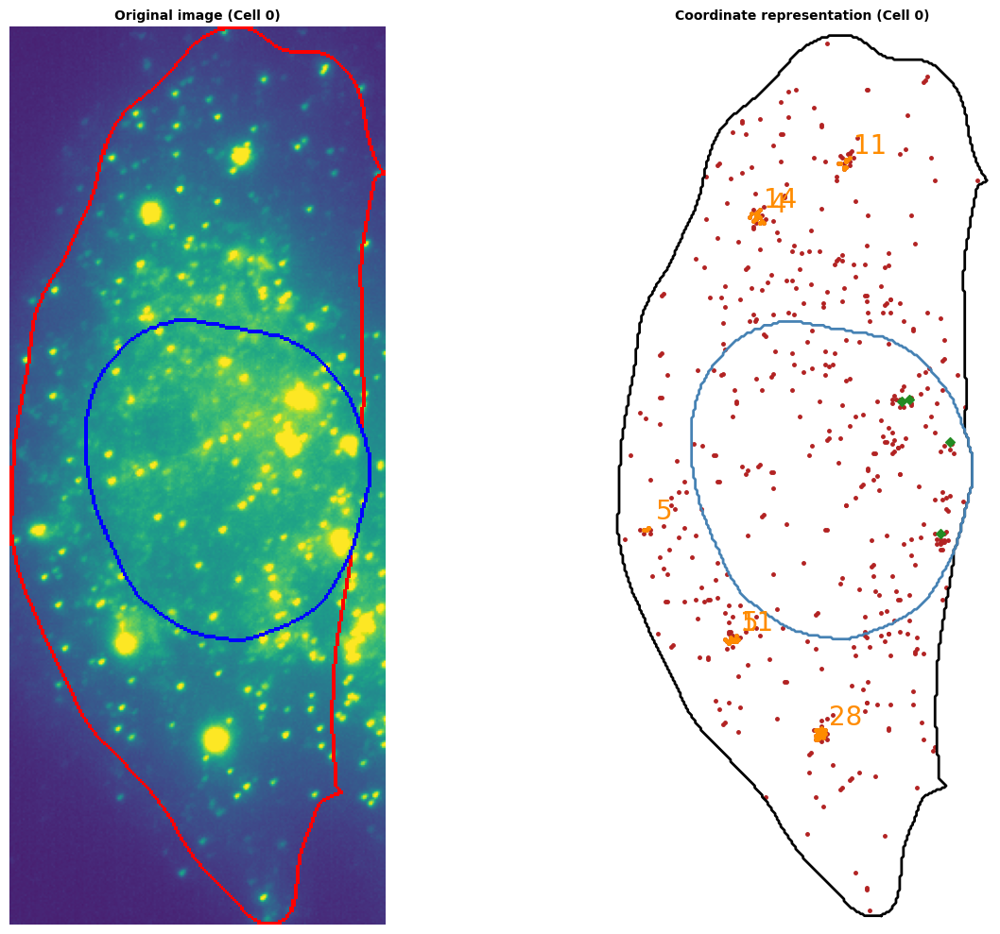

cell 1
 number of rna 528
 number of foci 7
 number of transcription sites 3


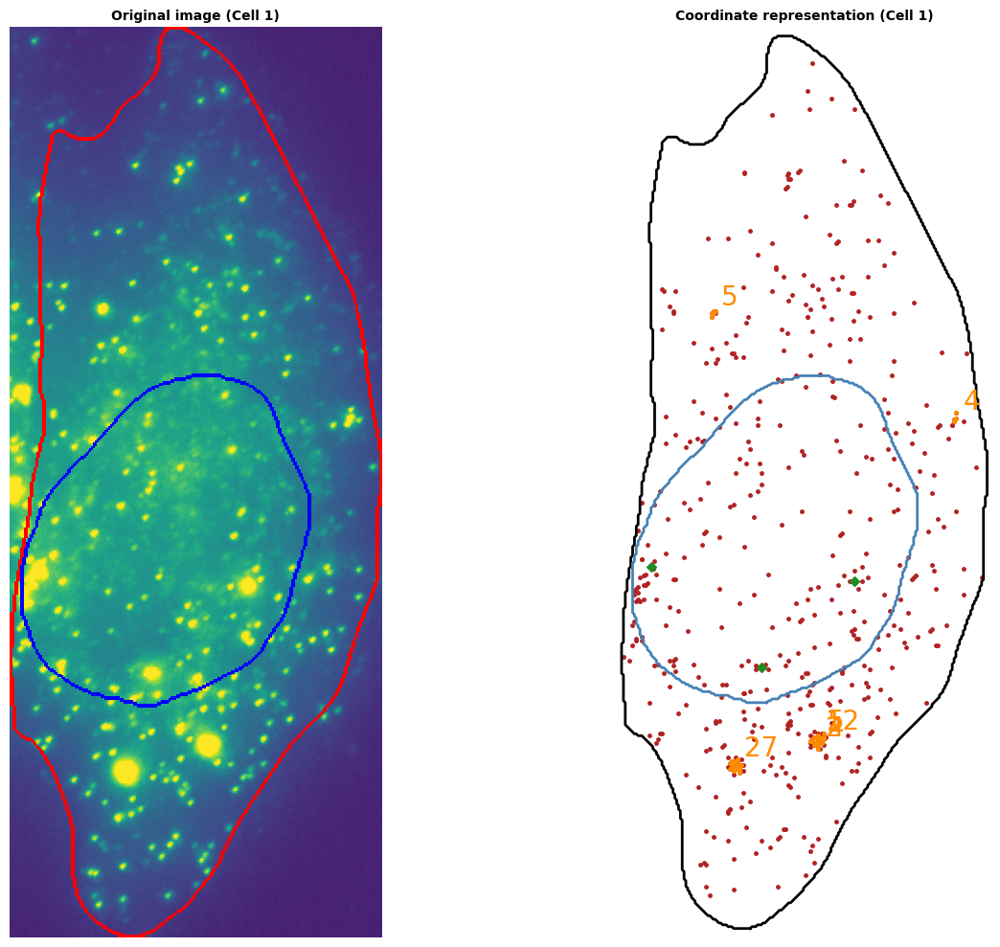

In [ ]:
for i, cell_results in enumerate(fov_results):
    print("cell {0}".format(i))

    # get cell results
    cell_mask = cell_results["cell_mask"]
    cell_coord = cell_results["cell_coord"]
    nuc_mask = cell_results["nuc_mask"]
    nuc_coord = cell_results["nuc_coord"]
    rna_coord = cell_results["rna_coord"]
    foci_coord = cell_results["foci"]
    ts_coord = cell_results["transcription_site"]
    image_contrasted = cell_results["image"]
    print("\r number of rna {0}".format(len(rna_coord)))
    print("\r number of foci {0}".format(len(foci_coord)))
    print("\r number of transcription sites {0}".format(len(ts_coord)))

    # plot cell
    plot.plot_cell(
        ndim=3, cell_coord=cell_coord, nuc_coord=nuc_coord,
        rna_coord=rna_coord, foci_coord=foci_coord, other_coord=ts_coord,
        image=image_contrasted, cell_mask=cell_mask, nuc_mask=nuc_mask,
        title="Cell {0}".format(i))

In [ ]:
df = multistack.summarize_extraction_results(fov_results, ndim=3)
print("shape: {0}".format(df.shape))
df.head()

shape: (2, 8)


,cell_id,cell_area,nuc_area,nb_rna,nb_rna_in_nuc,nb_rna_out_nuc,nb_foci,nb_transcription_site
0,1,64738,19991,558,175,383,7,4
1,2,66890,20199,528,151,377,7,3


**Save cell level results**

In [ ]:
for i, cell_results in enumerate(fov_results):
    # save results
    path = os.path.join(path_output, "results_cell_{0}.npz".format(i))
    stack.save_cell_extracted(cell_results, path)

Read results for the first cell - just to verify.

In [ ]:
# read results for the first cell of the FoV
path = os.path.join(path_output, "results_cell_0.npz")
cell_results = stack.read_cell_extracted(path, verbose=True)
print(cell_results["rna_coord"])

Available keys: cell_id, bbox, cell_coord, cell_mask, nuc_coord, nuc_mask, rna_coord, foci, transcription_site, image, dapi, smfish 

[[  4  28  95  -1]
 [  4  38 105  -1]
 [  4  73  66  -1]
 ...
 [ 22 213 170  -1]
 [ 22 213 147  -1]
 [ 22 262  90  -1]]


# Compute features for each cell

In [ ]:
# load single cell data
path = os.path.join(path_output, "results_cell_0.npz")
data = stack.read_cell_extracted(path, verbose=True)

cell_mask = data["cell_mask"]
print("cell mask")
print("\r shape: {0}".format(cell_mask.shape))
print("\r dtype: {0}".format(cell_mask.dtype), "\n")

nuc_mask = data["nuc_mask"]
print("nucleus mask")
print("\r shape: {0}".format(nuc_mask.shape))
print("\r dtype: {0}".format(nuc_mask.dtype), "\n")

rna_coord = data["rna_coord"]
print("RNAs coordinates")
print("\r shape: {0}".format(rna_coord.shape))
print("\r dtype: {0}".format(rna_coord.dtype), "\n")

foci_coord = data["foci"]
print("foci coordinates")
print("\r shape: {0}".format(foci_coord.shape))
print("\r dtype: {0}".format(foci_coord.dtype), "\n")

smfish = data["smfish"]
print("smfish channel")
print("\r shape: {0}".format(smfish.shape))
print("\r dtype: {0}".format(smfish.dtype))

Available keys: cell_id, bbox, cell_coord, cell_mask, nuc_coord, nuc_mask, rna_coord, foci, transcription_site, image, dapi, smfish 

cell mask
 shape: (473, 198)
 dtype: bool 

nucleus mask
 shape: (473, 198)
 dtype: bool 

RNAs coordinates
 shape: (558, 4)
 dtype: int64 

foci coordinates
 shape: (7, 5)
 dtype: int64 

smfish channel
 shape: (473, 198)
 dtype: uint16


bigfish offers many types of features that can be extracted. <p>

**Distance related features** compute the mean or median distance of RNAs to cellular or nuclear membrane. Distances are normalized by the expected distance in case of uniform RNAs distribution (index features). <p>

**Intranuclear features** compute RNAs proportion inside nucleus.<p>

**Protrusion related features** compute the number of RNAs detected in a cell protrusion. The count of RNAs is normalized by the expected count in case of uniform RNAs distribution (index_rna_protrusion) or the total number of RNAs (proportion_rna_protrusion).<p>

**Dispersion features** compute dispersion indices describe in (Stueland et al. 2019). A high index means a high level of RNAs polarization or dispersion within the cell. <p>

**Topographic features** compute the number of RNAs detected in specific cellular subregions. These regions are defined by concentric circles around the nucleus (every 500 nanometers) or the cellular membrane. The count of RNAs is normalized by the expected count in case of uniform RNAs distribution (index features) or the total number of RNAs (proportion features). For example, proportion_rna_cell_radius_500_1000 is the proportion of RNAs detected between 500nm and 1000nm from the cellular membrane.<p>

**Foci related features** computes the proportion of RNAs detected in a foci.<p>

**Area related features** compute the nucleus and cell area.<p>

**Centrosomal features** compute the mean or median distance of RNAs to the closest centrosome (index_mean_distance_centrosome and index_median_distance_centrosome) or the number of RNAs detected within 2000 nanometers of a centrosome. The count of RNAs is normalized by the expected count in case of uniform RNAs distribution (index_rna_centrosome) or the total number of RNAs (proportion_rna_centrosome). Feature index_centrosome_dispersion is adapted from [(Stueland et al. 2019)] to quantify the dispersion of RNAs around centrosomes. A low index means RNAs are located close to the centrosomes.

In [ ]:
import bigfish.classification as classification

Check the following features by printing each.

In [ ]:
# get distance feature names
feature_names1 = classification.get_features_name(names_features_distance=True)
feature_names2 = classification.get_features_name(names_features_intranuclear=True)
feature_names3 = classification.get_features_name(names_features_protrusion=True)
feature_names4 = classification.get_features_name(names_features_dispersion=True)
feature_names5 = classification.get_features_name(names_features_topography=True)
feature_names1

['index_mean_distance_cell',
 'index_median_distance_cell',
 'index_mean_distance_nuc',
 'index_median_distance_nuc']

**Compute features** <br>
Let us compute features for each cell and capture into a pandas dataframe to be exported to a csv file.

In [ ]:
import pandas as pd

In [ ]:
# compute features for all cells
# parse different results files
dataframes = []
for filename in ["results_cell_0.npz", "results_cell_1.npz"]:

    # load single cell data
    path = os.path.join(path_output, filename)
    data = stack.read_cell_extracted(path)
    cell_mask = data["cell_mask"]
    nuc_mask = data["nuc_mask"]
    rna_coord = data["rna_coord"]
    foci_coord = data["foci"]
    smfish = data["smfish"]

    # compute features
    features, features_names = classification.compute_features(
    cell_mask, nuc_mask, ndim=3, rna_coord=rna_coord,
    smfish=smfish, voxel_size_yx=103,
    foci_coord=foci_coord,
    centrosome_coord=None,
    compute_distance=True,
    compute_intranuclear=True,
    compute_protrusion=True,
    compute_dispersion=True,
    compute_topography=True,
    compute_foci=True,
    compute_area=True,
    return_names=True)

    # build dataframe
    features = features.reshape((1, -1))
    df_cell = pd.DataFrame(data=features, columns=features_names)
    dataframes.append(df_cell)

# concatenate dataframes
df = pd.concat(dataframes)

# reset index
df.reset_index(drop=True, inplace=True)
df

/usr/local/lib/python3.10/dist-packages/bigfish/classification/features.py:546: FutureWarning: `selem` is a deprecated argument name for `binary_opening`. It will be removed in version 1.0. Please use `footprint` instead.
  mask_cell_opened = binary_opening(cell_mask, selem=s)
/usr/local/lib/python3.10/dist-packages/bigfish/classification/features.py:546: FutureWarning: `selem` is a deprecated argument name for `binary_opening`. It will be removed in version 1.0. Please use `footprint` instead.
  mask_cell_opened = binary_opening(cell_mask, selem=s)


,index_mean_distance_cell,index_median_distance_cell,index_mean_distance_nuc,index_median_distance_nuc,proportion_rna_in_nuc,nb_rna_out_nuc,nb_rna_in_nuc,index_rna_protrusion,proportion_rna_protrusion,protrusion_area,...,proportion_rna_cell_radius_1500_2000,index_rna_cell_radius_2000_2500,proportion_rna_cell_radius_2000_2500,index_rna_cell_radius_2500_3000,proportion_rna_cell_radius_2500_3000,proportion_rna_in_foci,proportion_nuc_area,cell_area,nuc_area,cell_area_out_nuc
0,1.07,1.17,0.80,0.78,0.31,383.0,175.0,0.61,0.01,760.0,...,0.05,0.67,0.04,0.51,0.03,0.14,0.31,64738.0,19991.0,44747.0
1,1.05,1.09,0.69,0.78,0.29,377.0,151.0,0.37,0.00,694.0,...,0.05,0.49,0.03,0.60,0.03,0.11,0.30,66890.0,20199.0,46691.0


Export results to a csv file

In [ ]:
path = os.path.join(path_output, "df_features.csv")
stack.save_data_to_csv(df, path)

**End notes:** <p>
The information about various quantitative feature measurements obtained from smFISH analysis can provide valuable insights into different aspects of cellular and molecular biology. <p>

**mean_distance_cell:** This parameter represents the average distance of mRNA spots to the cell boundary. It can provide information about the spatial distribution of mRNA molecules within the cell. For example, a smaller mean distance may suggest a more centralized distribution, while a larger mean distance may indicate a more dispersed or peripheral localization. <p>

**mean_distance_nucleus:** Similar to mean_distance_cell, this parameter measures the average distance of mRNA spots to the nuclear boundary. It can provide insights into the spatial organization of mRNA molecules with respect to the nucleus, indicating whether they are preferentially localized near or away from the nucleus. <p>

**proportion_rna_in_nucleus:**This parameter indicates the proportion of mRNA molecules that are localized within the nucleus. It can help understand the extent of nuclear involvement of specific genes or the efficiency of nuclear transport mechanisms. Genes with a higher proportion of mRNA in the nucleus may be associated with nuclear processes such as transcription, splicing, or RNA processing. <p>

**nb_rna_out_nuc:** This parameter represents the number of mRNA molecules localized outside the nucleus. It provides information about the fraction of mRNA molecules that have been transported from the nucleus to the cytoplasm. A higher number of RNA molecules outside the nucleus may indicate active cytoplasmic functions such as translation or degradation. <p>

**proportion_rna_protrusion:** This parameter refers to the proportion of mRNA molecules localized in cellular protrusions or extensions. It can provide insights into mRNA localization within specialized cellular structures, indicating potential roles in processes such as cell migration, axon guidance, or cellular signaling. <p>

**proportion_rna_cell_radius_2500_3000:** This parameter represents the proportion of mRNA molecules located within a specific radial distance from the cell center. It can help identify mRNA molecules that are preferentially localized closer to or farther from the cell center. Such localization patterns may be associated with specific cellular functions or cellular compartments.

# Other useful repositories



*   https://github.com/MunskyGroup/FISH_Processing
*   https://spacetx-starfish.readthedocs.io/en/latest/index.html#
* https://github.com/PreibischLab/RS-FISH

